# EXAMEN PRIMER PARCIAL - MODELOS COMPUTACIONALES II
### Estela Gil

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
from sklearn.decomposition import PCA, KernelPCA
from sklearn.preprocessing import StandardScaler
from mpl_toolkits.mplot3d import Axes3D

## Parte I - Reproducir el análisis de PCA aplicado al dataset "Iris", utilizando 3 componentes

In [2]:
file_iris_path = r"C:\Users\estel\OneDrive\Escritorio\NEUROCIENCIAS\SEXTO SEMESTRE\modelos II python\Neurociencias-2025-2\S03_datasets\iris\iris.csv"

In [3]:
df_iris = pd.read_csv(file_iris_path)
df_iris.head()

,Sepal.Length,Sepal.Width,Petal.Length,Petal.Width,Species
0,5.1,3.5,1.4,0.2,setosa
1,4.9,3.0,1.4,0.2,setosa
2,4.7,3.2,1.3,0.2,setosa
3,4.6,3.1,1.5,0.2,setosa
4,5.0,3.6,1.4,0.2,setosa


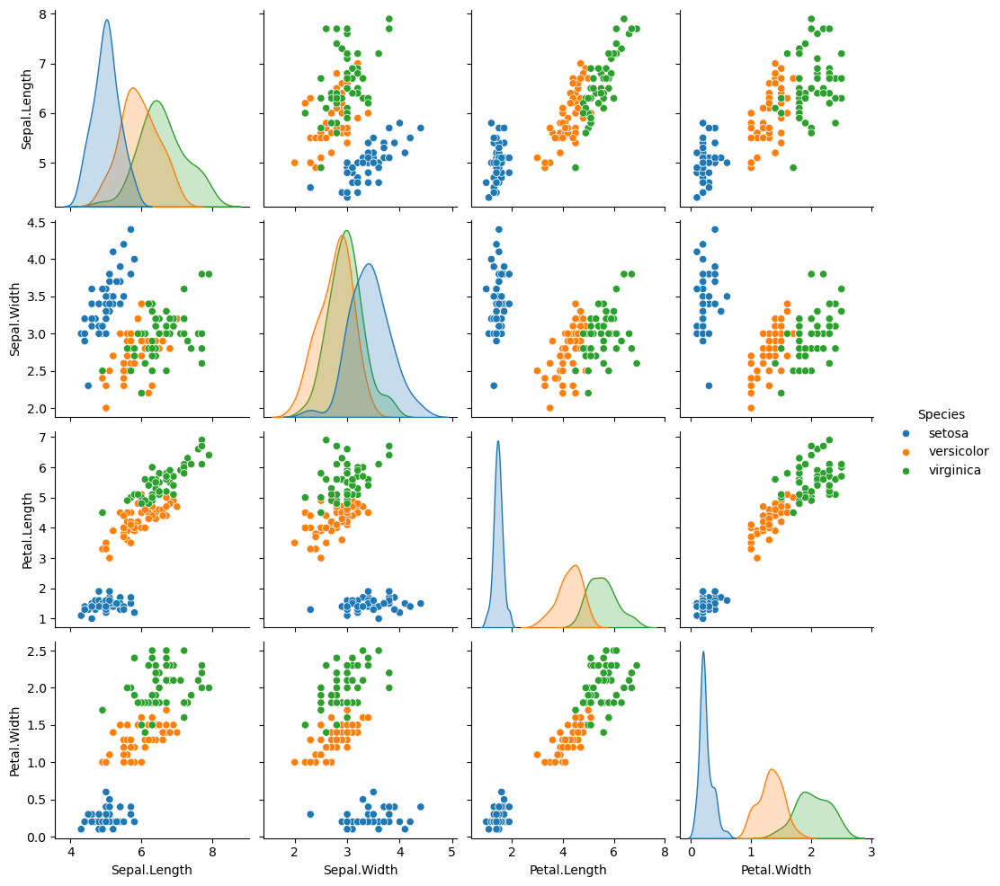

In [4]:
X = df_iris.iloc[:, :4] 
sns.pairplot(df_iris, hue = "Species")

In [5]:
# df_iris['Species'].unique()

In [6]:
np.mean(X, axis=0), np.std(X, axis=0) # normalización de datos

(Sepal.Length    5.843333
 Sepal.Width     3.057333
 Petal.Length    3.758000
 Petal.Width     1.199333
 dtype: float64,
 Sepal.Length    0.825301
 Sepal.Width     0.434411
 Petal.Length    1.759404
 Petal.Width     0.759693
 dtype: float64)

In [7]:
X_std = (X - np.mean(X, axis=0))/np.std(X, axis=0)
X_std

,Sepal.Length,Sepal.Width,Petal.Length,Petal.Width
0,-0.900681,1.019004,-1.340227,-1.315444
1,-1.143017,-0.131979,-1.340227,-1.315444
2,-1.385353,0.328414,-1.397064,-1.315444
3,-1.506521,0.098217,-1.283389,-1.315444
4,-1.021849,1.249201,-1.340227,-1.315444
...,...,...,...,...
145,1.038005,-0.131979,0.819596,1.448832
146,0.553333,-1.282963,0.705921,0.922303
147,0.795669,-0.131979,0.819596,1.053935
148,0.432165,0.788808,0.933271,1.448832


In [8]:
X_std.iloc[:, 0]

0     -0.900681
1     -1.143017
2     -1.385353
3     -1.506521
4     -1.021849
         ...   
145    1.038005
146    0.553333
147    0.795669
148    0.432165
149    0.068662
Name: Sepal.Length, Length: 150, dtype: float64

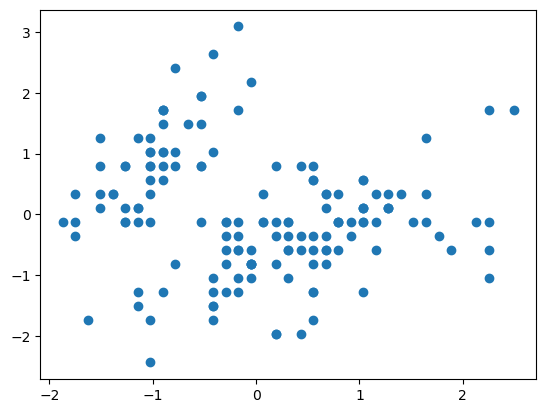

In [9]:
plt.scatter(X_std.iloc[:, 0], X_std.iloc[:, 1])

### Matriz de covarianza

In [10]:
X_mean = np.mean(X_std, axis=0)
X_mean

Sepal.Length   -4.736952e-16
Sepal.Width    -8.052818e-16
Petal.Length   -2.842171e-16
Petal.Width    -4.736952e-16
dtype: float64

In [11]:
cov_matrix = (X_std - X_mean).T.dot((X_std - X_mean))/(X_std.shape[0]-1)
cov_matrix

,Sepal.Length,Sepal.Width,Petal.Length,Petal.Width
Sepal.Length,1.006711,-0.118359,0.877604,0.823431
Sepal.Width,-0.118359,1.006711,-0.431316,-0.368583
Petal.Length,0.877604,-0.431316,1.006711,0.969328
Petal.Width,0.823431,-0.368583,0.969328,1.006711


In [12]:
eig_vals, eig_vecs = np.linalg.eig(cov_matrix)
eig_vals, eig_vecs

(array([2.93808505, 0.9201649 , 0.14774182, 0.02085386]),
 array([[ 0.52106591, -0.37741762, -0.71956635,  0.26128628],
        [-0.26934744, -0.92329566,  0.24438178, -0.12350962],
        [ 0.5804131 , -0.02449161,  0.14212637, -0.80144925],
        [ 0.56485654, -0.06694199,  0.63427274,  0.52359713]]))

### Cálculo de valores y vectores propios 

In [13]:
eig_vals, eig_vecs = np.linalg.eig(cov_matrix)
eig_vals, eig_vecs

(array([2.93808505, 0.9201649 , 0.14774182, 0.02085386]),
 array([[ 0.52106591, -0.37741762, -0.71956635,  0.26128628],
        [-0.26934744, -0.92329566,  0.24438178, -0.12350962],
        [ 0.5804131 , -0.02449161,  0.14212637, -0.80144925],
        [ 0.56485654, -0.06694199,  0.63427274,  0.52359713]]))

In [14]:
eig_pairs = [(np.abs(eig_vals[i]), eig_vecs[:,i]) for i in range(len(eig_vals))]
eig_pairs # porcentaje de cada vector

[(2.9380850501999918,
  array([ 0.52106591, -0.26934744,  0.5804131 ,  0.56485654])),
 (0.9201649041624878,
  array([-0.37741762, -0.92329566, -0.02449161, -0.06694199])),
 (0.14774182104494835,
  array([-0.71956635,  0.24438178,  0.14212637,  0.63427274])),
 (0.02085386217646261,
  array([ 0.26128628, -0.12350962, -0.80144925,  0.52359713]))]

In [15]:
eig_pairs.sort(reverse=True)
total_sum = sum(eig_vals)
var_exp = [(i/total_sum)*100 for i in sorted(eig_vals, reverse=True)]
cum_var_exp = np.cumsum(var_exp)

In [16]:
print("% de info de cada valor propio:", var_exp)
print("% de info acumulado:", cum_var_exp)

% de info de cada valor propio: [72.96244541329983, 22.850761786701792, 3.668921889282886, 0.5178709107154884]
% de info acumulado: [ 72.96244541  95.8132072   99.48212909 100.        ]


### Matriz que representa transformación lineal

In [17]:
eig_pairs

[(2.9380850501999918,
  array([ 0.52106591, -0.26934744,  0.5804131 ,  0.56485654])),
 (0.9201649041624878,
  array([-0.37741762, -0.92329566, -0.02449161, -0.06694199])),
 (0.14774182104494835,
  array([-0.71956635,  0.24438178,  0.14212637,  0.63427274])),
 (0.02085386217646261,
  array([ 0.26128628, -0.12350962, -0.80144925,  0.52359713]))]

In [18]:
eig_pairs[0][1], eig_pairs[1][1]

(array([ 0.52106591, -0.26934744,  0.5804131 ,  0.56485654]),
 array([-0.37741762, -0.92329566, -0.02449161, -0.06694199]))

In [19]:
T_mat = np.stack((eig_pairs[0][1], eig_pairs[1][1]), axis=1)
T_mat

array([[ 0.52106591, -0.37741762],
       [-0.26934744, -0.92329566],
       [ 0.5804131 , -0.02449161],
       [ 0.56485654, -0.06694199]])

In [20]:
Y = X_std.dot(T_mat)
Y

,0,1
0,-2.264703,-0.480027
1,-2.080961,0.674134
2,-2.364229,0.341908
3,-2.299384,0.597395
4,-2.389842,-0.646835
...,...,...
145,1.870503,-0.386966
146,1.564580,0.896687
147,1.521170,-0.269069
148,1.372788,-1.011254


In [21]:
pca = PCA(n_components=2)
datos_proyeccion = pca.fit_transform(X_std)

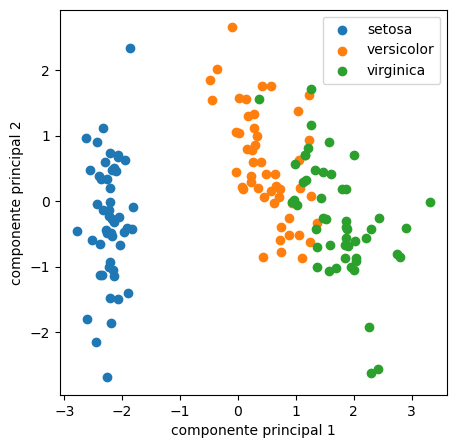

In [22]:
y = df_iris['Species']
plt.figure(figsize=(5, 5))

for name in ('setosa', 'versicolor', 'virginica'):
    plt.scatter(datos_proyeccion[y==name,0], 
                -datos_proyeccion[y==name,1], 
                label=name)

plt.xlabel("componente principal 1")
plt.ylabel("componente principal 2")

plt.legend()
plt.show()

## Parte II - Realizar el análisis de PCA utilizando el dataset "Brain_tumor", archivo Brain tumor.csv

In [23]:
file_bt_path = r"C:\Users\estel\OneDrive\Escritorio\NEUROCIENCIAS\SEXTO SEMESTRE\modelos II python\Neurociencias-2025-2\S03_datasets\Brain_tumor\Brain Tumor.csv"

In [24]:
df_bt = pd.DataFrame({"column": ["3.14", "2.71", "Image1"]})
df_bt["column"] = pd.to_numeric(df_bt["column"], errors ="coerce")

In [25]:
df_bt = pd.read_csv(file_bt_path)
df_bt.head()

,Image,Class,Mean,Variance,Standard Deviation,Entropy,Skewness,Kurtosis,Contrast,Energy,ASM,Homogeneity,Dissimilarity,Correlation,Coarseness
0,Image1,0,6.535339,619.587845,24.891522,0.109059,4.276477,18.900575,98.613971,0.293314,0.086033,0.530941,4.473346,0.981939,7.458341e-155
1,Image2,0,8.749969,805.957634,28.389393,0.266538,3.718116,14.464618,63.858816,0.475051,0.225674,0.651352,3.220072,0.988834,7.458341e-155
2,Image3,1,7.341095,1143.808219,33.820234,0.001467,5.061750,26.479563,81.867206,0.031917,0.001019,0.268275,5.981800,0.978014,7.458341e-155
3,Image4,1,5.958145,959.711985,30.979219,0.001477,5.677977,33.428845,151.229741,0.032024,0.001026,0.243851,7.700919,0.964189,7.458341e-155
4,Image5,0,7.315231,729.540579,27.010009,0.146761,4.283221,19.079108,174.988756,0.343849,0.118232,0.501140,6.834689,0.972789,7.458341e-155


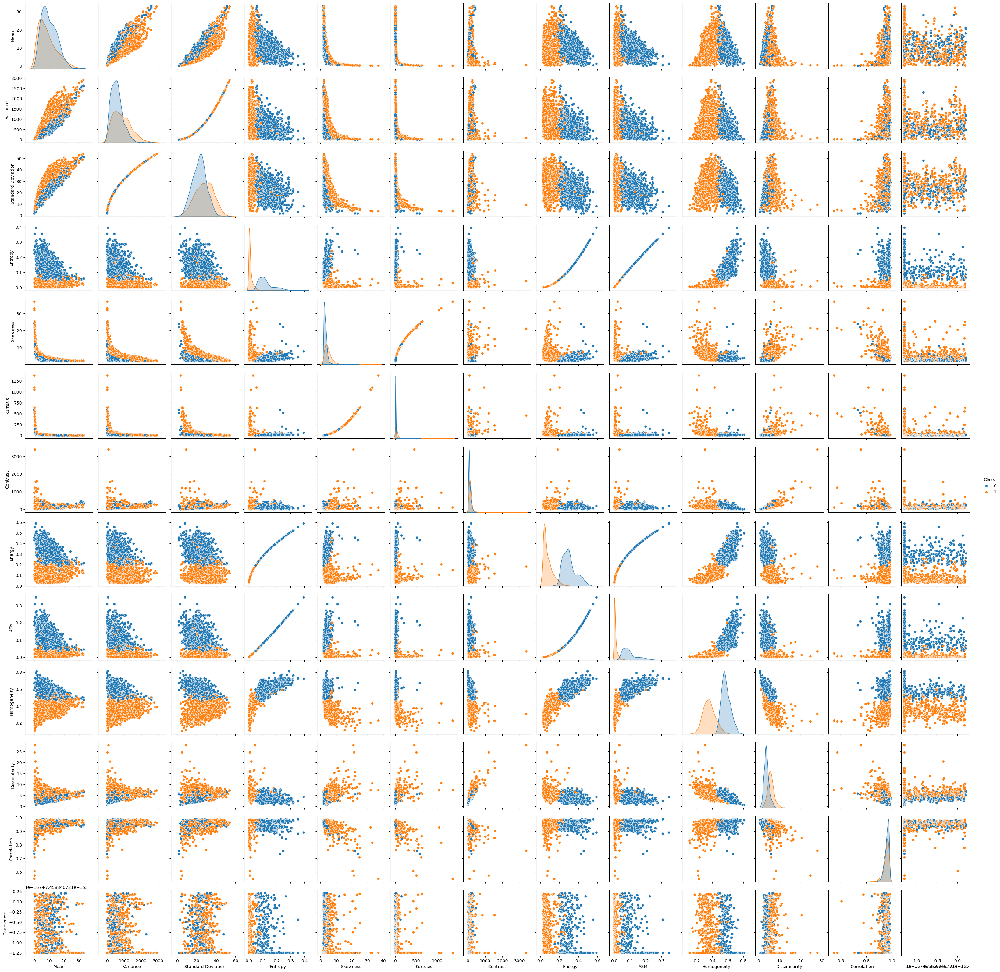

In [26]:
Z = df_bt.iloc[:, :4]
sns.pairplot(df_bt, hue = 'Class')

### Método 1

In [27]:
df_bt = pd.read_csv(file_bt_path)

In [28]:
num_dat = df_bt.select_dtypes(include=[np.number])

In [29]:
scaler = StandardScaler()
X2_std = scaler.fit_transform(num_dat) # normalización

In [30]:
pca = PCA()
pca.fit(X2_std) 

PCA()

In [34]:
explained_variance = np.cumsum(pca.explained_variance_ratio_)
num_components = np.argmax(explained_variance >= 0.90) + 1
print("Componentes necesarios para al menos 90% de varianza:", num_components)
print("Varianza por componente:", pca.explained_variance_ratio_)

Componentes necesarios para al menos 90% de varianza: 4
Varianza por componente: [4.32763571e-01 2.89082793e-01 1.22201578e-01 5.79901851e-02
 4.66411481e-02 2.07752620e-02 1.57590645e-02 8.08519247e-03
 2.58845124e-03 2.19100325e-03 1.13268047e-03 7.84886853e-04
 4.18414299e-06 0.00000000e+00]


In [35]:
pca_n = PCA(n_components = num_components)
datos_proyeccion = pca_n.fit_transform(X2_std)
df_proyectado = pd.DataFrame(datos_proyeccion, columns = [f'CP{i+1}' for i in range(num_components)])

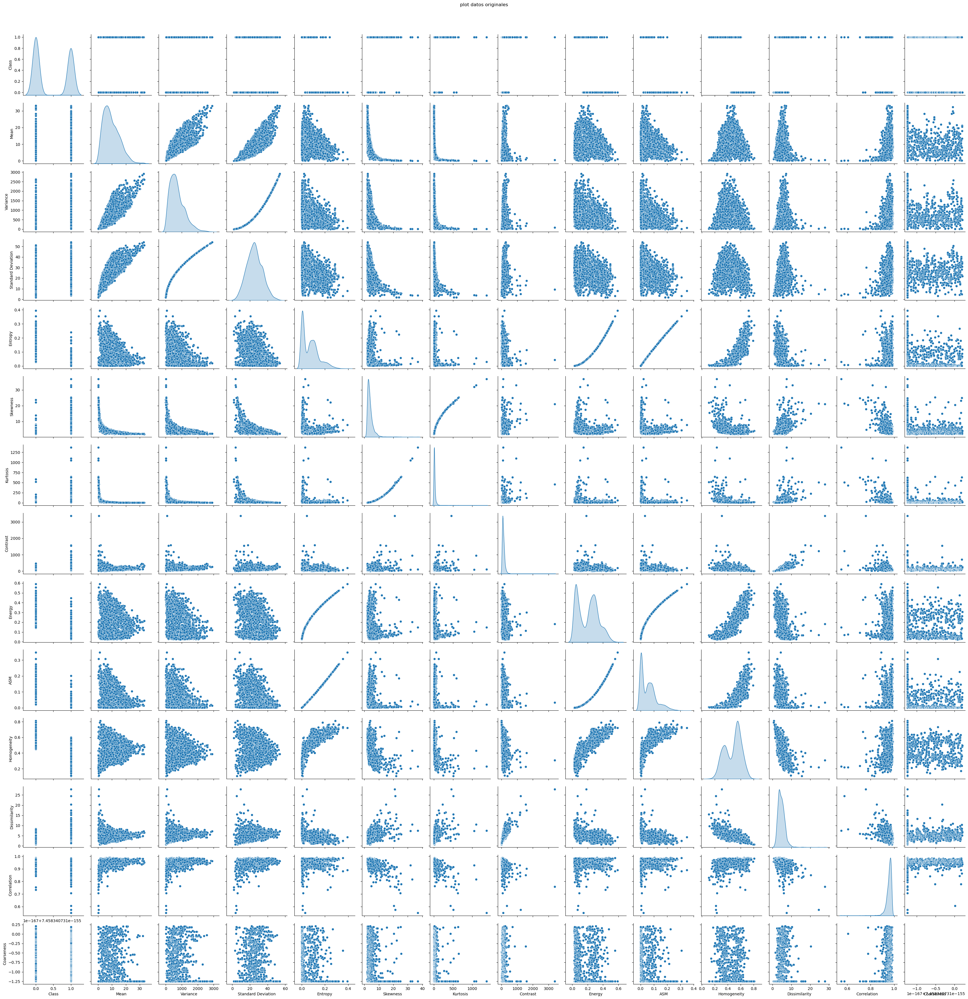

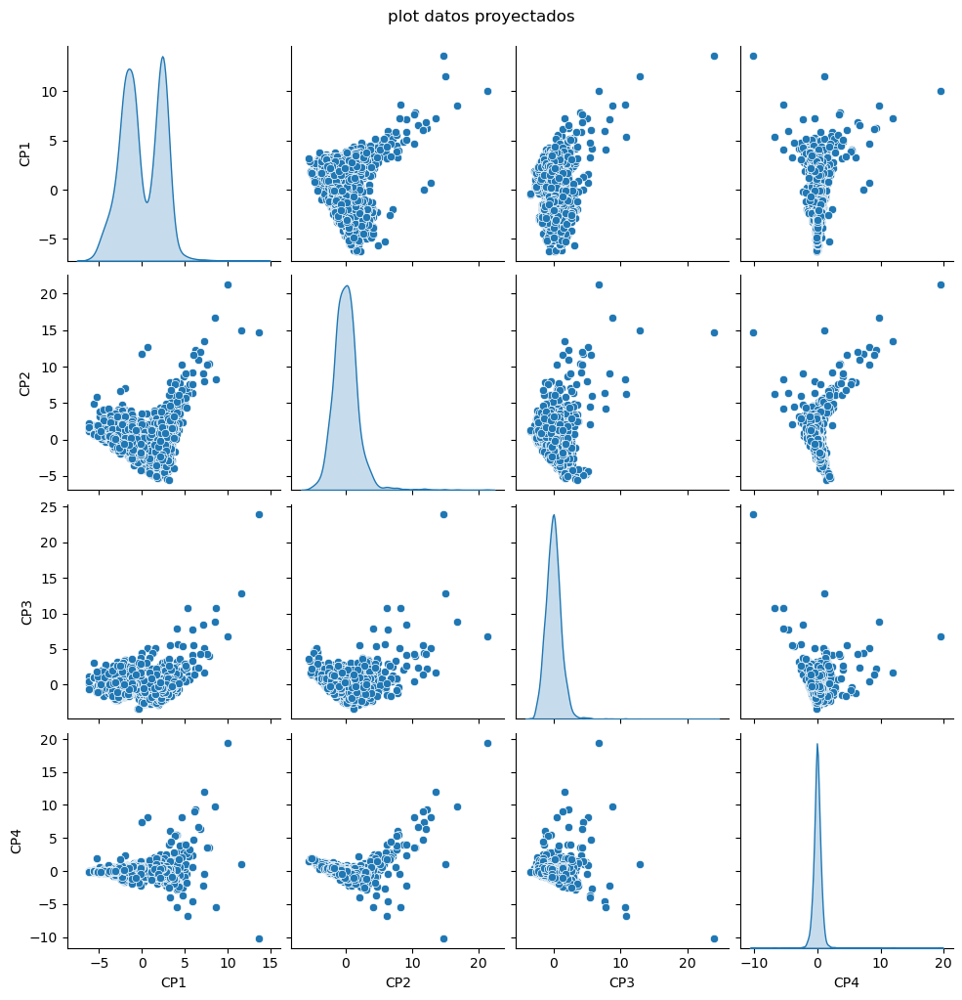

In [36]:
sns.pairplot(df_bt, diag_kind='kde')
plt.suptitle("plot datos originales", y = 1.02)
plt.show()

sns.pairplot(df_proyectado, diag_kind = 'kde')
plt.suptitle("plot datos proyectados", y = 1.02)
plt.show()

### Método 2

In [37]:
df_bt = pd.read_csv(file_bt_path)
num_dat = df_bt.select_dtypes(include=[np.number])
num_dat = num_dat.dropna()

In [38]:
scaler = StandardScaler()
X2_std = scaler.fit_transform(num_dat) # normalización de datos

In [39]:
pca = PCA()
pca.fit(X2_std)

PCA()

In [40]:
explained_variance = np.cumsum(pca.explained_variance_ratio_)
num_components = np.argmax(explained_variance >= 0.90) + 1
print("Componentes necesarios para al menos 90% de varianza:", num_components)
print("Varianza por cada componente:", pca.explained_variance_ratio_)

Componentes necesarios para al menos 90% de varianza: 4
Varianza por cada componente: [4.32763571e-01 2.89082793e-01 1.22201578e-01 5.79901851e-02
 4.66411481e-02 2.07752620e-02 1.57590645e-02 8.08519247e-03
 2.58845124e-03 2.19100325e-03 1.13268047e-03 7.84886853e-04
 4.18414299e-06 0.00000000e+00]


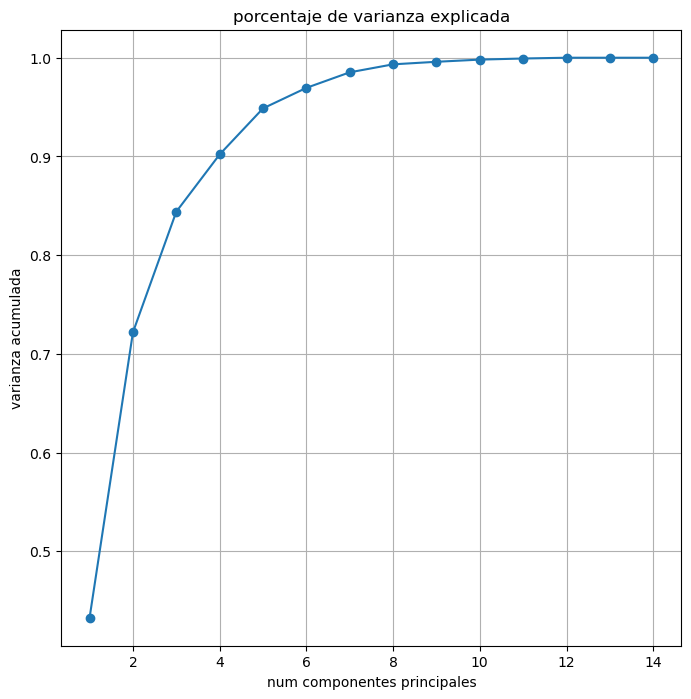

In [41]:
plt.figure(figsize = (8, 8))
plt.plot(range(1, len(explained_variance)+1), explained_variance, marker='o', linestyle='-')
plt.title('porcentaje de varianza explicada')
plt.xlabel('num componentes principales')
plt.ylabel('varianza acumulada')
plt.grid()
plt.show()

In [43]:
pca_n = PCA(n_components = num_components)
datos_proyec_pca = pca_n.fit_transform(X2_std) # proyeccion con PCA
kpca = KernelPCA(n_components = num_components, kernel = 'rbf')
datos_proyec_kpca = kpca.fit_transform(X2_std) # proyeccion con kernel

In [44]:
df_proyec_pca = pd.DataFrame(datos_proyec_pca, columns=[f'CP{i+1}' for i in range(num_components)])
df_proyec_kpca = pd.DataFrame(datos_proyec_kpca, columns=[f'KPCA{i+1}' for i in range(num_components)])

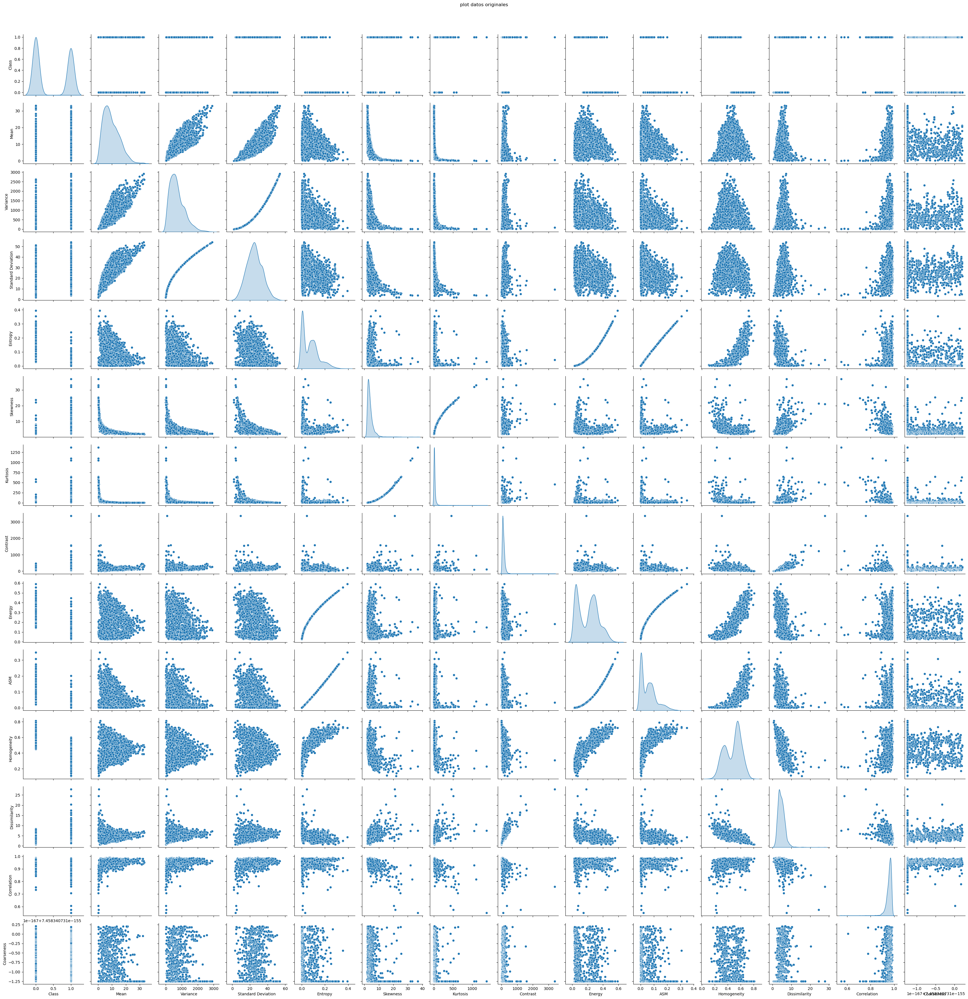

In [46]:
sns.pairplot(df_bt, diag_kind='kde')
plt.suptitle("plot datos originales", y=1.02)
plt.show()

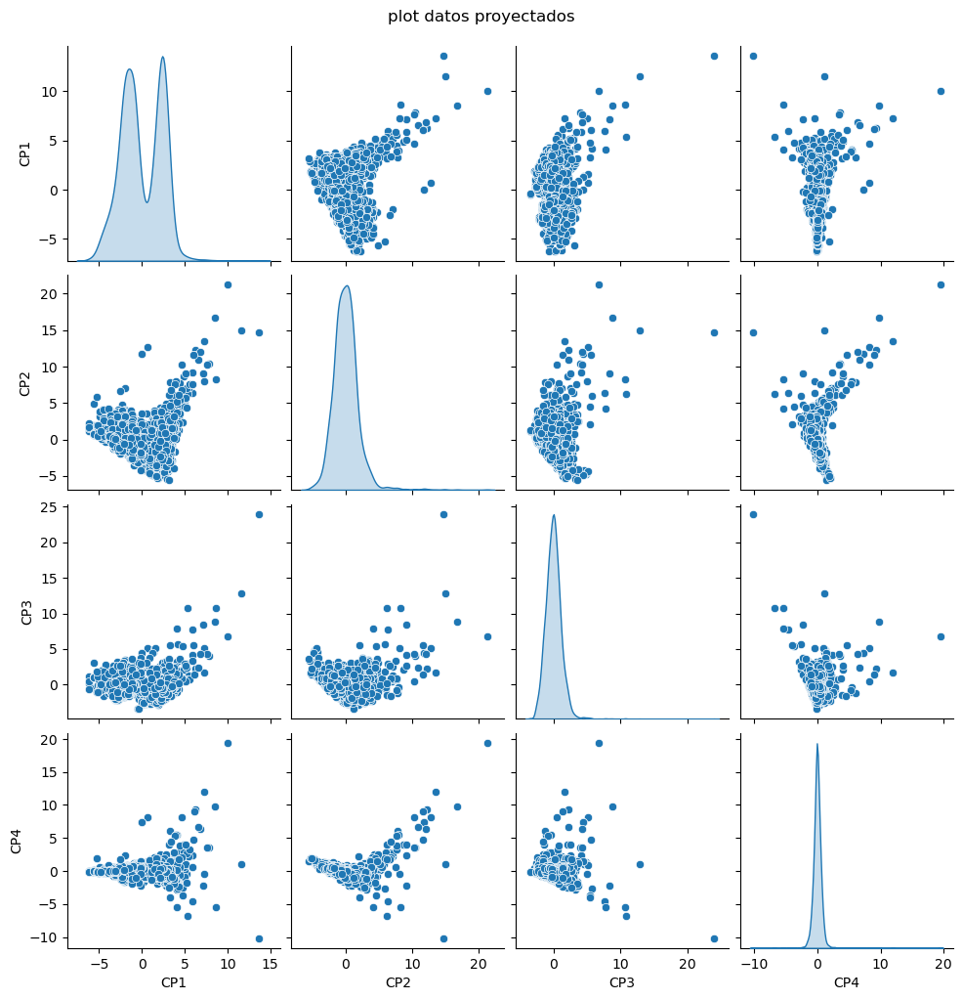

In [47]:
sns.pairplot(df_proyec_pca, diag_kind='kde')
plt.suptitle("plot datos proyectados", y=1.02)
plt.show()

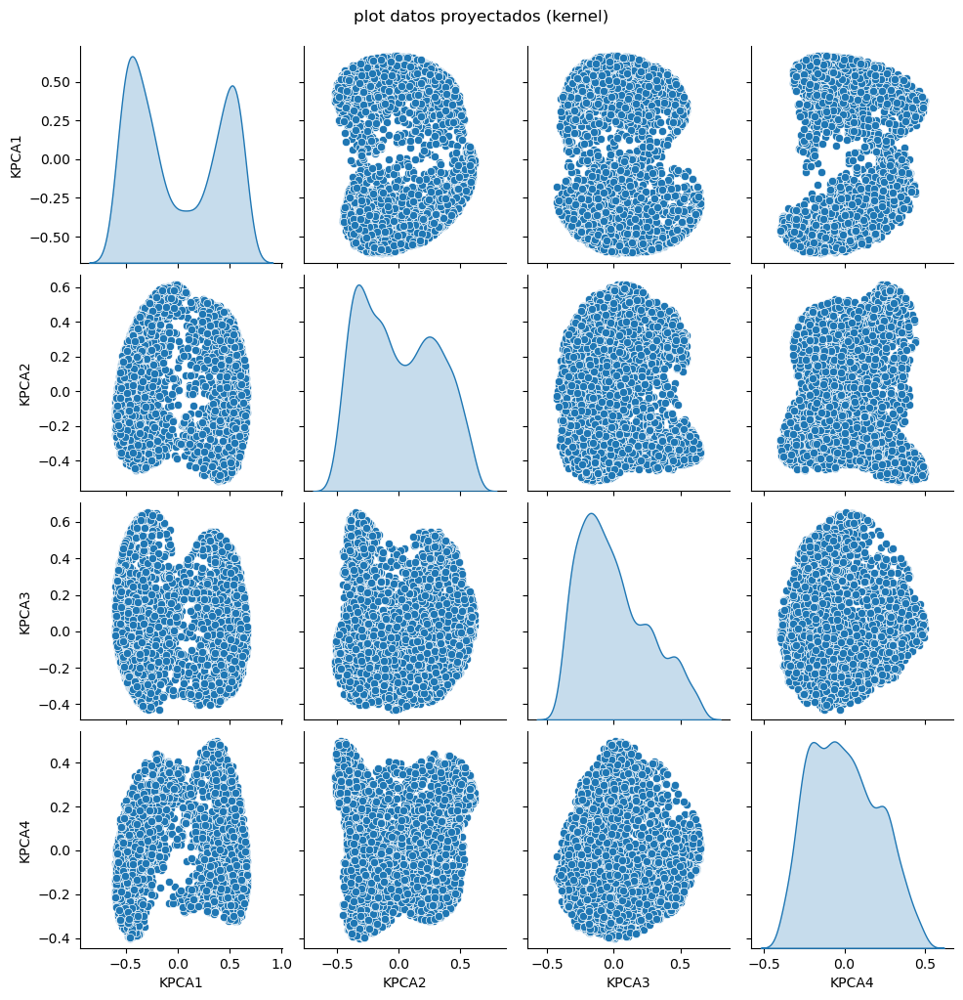

In [48]:
sns.pairplot(df_proyec_kpca, diag_kind='kde')
plt.suptitle("plot datos proyectados (kernel)", y=1.02)
plt.show()

### Columna Coarseness

In [50]:
col_coarseness = df_bt["Coarseness"]
col_coarseness

0       7.458341e-155
1       7.458341e-155
2       7.458341e-155
3       7.458341e-155
4       7.458341e-155
            ...      
3757    7.458341e-155
3758    7.458341e-155
3759    7.458341e-155
3760    7.458341e-155
3761    7.458341e-155
Name: Coarseness, Length: 3762, dtype: float64

In [51]:
col_coarseness.unique()

array([7.45834073e-155, 7.45834073e-155, 7.45834073e-155, 7.45834073e-155,
       7.45834073e-155, 7.45834073e-155, 7.45834073e-155, 7.45834073e-155,
       7.45834073e-155, 7.45834073e-155, 7.45834073e-155, 7.45834073e-155,
       7.45834073e-155, 7.45834073e-155, 7.45834073e-155, 7.45834073e-155,
       7.45834073e-155, 7.45834073e-155, 7.45834073e-155, 7.45834073e-155,
       7.45834073e-155, 7.45834073e-155, 7.45834073e-155, 7.45834073e-155,
       7.45834073e-155, 7.45834073e-155, 7.45834073e-155, 7.45834073e-155,
       7.45834073e-155, 7.45834073e-155, 7.45834073e-155, 7.45834073e-155,
       7.45834073e-155, 7.45834073e-155, 7.45834073e-155, 7.45834073e-155,
       7.45834073e-155, 7.45834073e-155, 7.45834073e-155, 7.45834073e-155,
       7.45834073e-155, 7.45834073e-155, 7.45834073e-155, 7.45834073e-155,
       7.45834073e-155, 7.45834073e-155, 7.45834073e-155, 7.45834073e-155,
       7.45834073e-155, 7.45834073e-155, 7.45834073e-155, 7.45834073e-155,
       7.45834073e-155, 7

In [53]:
col_coarseness.value_counts()

Coarseness
7.458341e-155    3189
7.458341e-155       7
7.458341e-155       7
7.458341e-155       7
7.458341e-155       6
                 ... 
7.458341e-155       2
7.458341e-155       2
7.458341e-155       1
7.458341e-155       1
7.458341e-155       1
Name: count, Length: 146, dtype: int64

Lo peculiar de "Coarseness" al analizarla con estas funciones es que debe haber problemas con la escritura de los datos (espacios en blanco, por ejemplo). Puede que también se deba al tipo de dato, que incluye una letra. 